In [1]:
%pip install -qq opencv-python-headless
%pip install -qq matplotlib
%pip install -qq numpy
%pip install -qq git+https://github.com/udesa-vision/i308-utils.git

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
from i308_utils import show_images, imshow

from pipeline3.preprocessing import load_images_from_folder, resize
from pipeline3.features import detect_features, anms
from pipeline3.matching import match_descriptors, draw_matches
from pipeline3.homography_manual import compute_homography_dlt, show_manual_matches_and_compute_H
# from pipeline.utils import select_correspondences, visualize_transformed_points
from pipeline3.utils import draw_matches_ransac
from pipeline3.ransac import ransac_homography
from pipeline3.stitching import stitch_images_with_blending

## Cargamos las Imágenes

In [3]:
# Cargar todas las imágenes
images_color, images_gray, resize_factors = load_images_from_folder("img", target_width=1500)

In [4]:
# Imágenes udesa (son las últimas 3)
img0_udesa, img1_udesa, img2_udesa = images_color[3:6]
gray0_udesa, gray1_udesa, gray2_udesa = images_gray[3:6]
resize_factor_udesa = resize_factors[3:6]

# Imágenes cuadro (son las primeras 3)
img0_cuadro, img1_cuadro, img2_cuadro = images_color[0:3]
gray0_cuadro, gray1_cuadro, gray2_cuadro = images_gray[0:3]
resize_factor_cuadro = resize_factors[0:3]

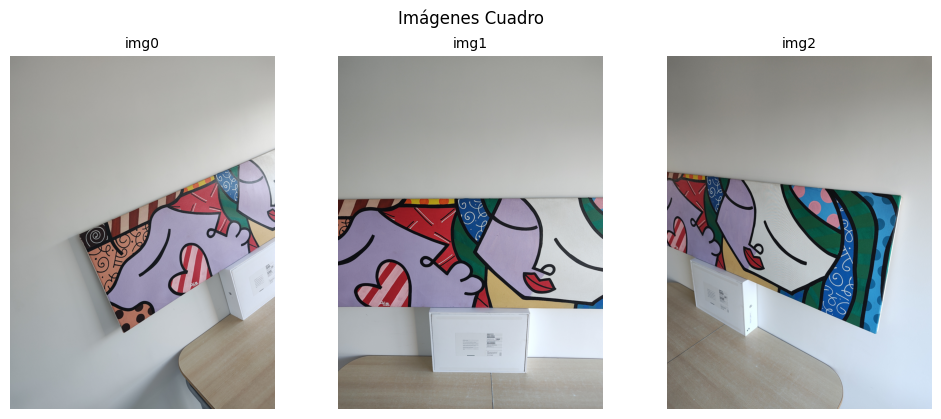

In [5]:
show_images([img0_cuadro, img1_cuadro, img2_cuadro], ['img0', 'img1', 'img2'], title='Imágenes Cuadro')

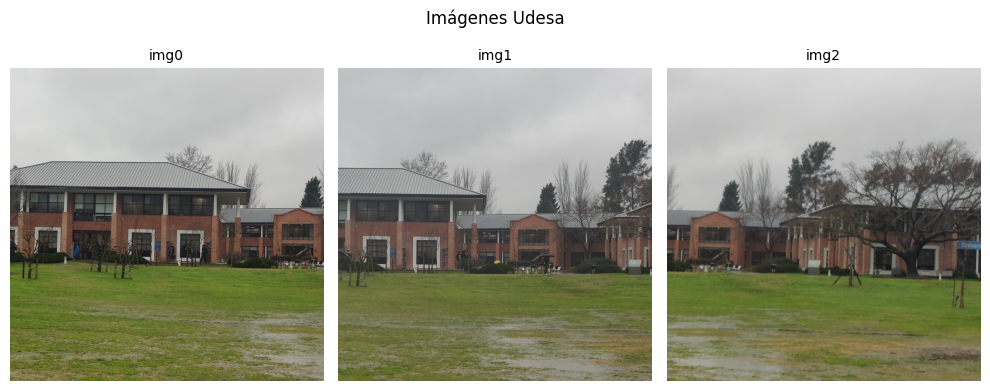

In [6]:
show_images([img0_udesa, img1_udesa, img2_udesa], ['img0', 'img1', 'img2'], title='Imágenes Udesa')

## Detectamos características en ambos conjuntos de imágenes usando SIFT

In [7]:
# Aplicar detector SIFT + descriptores
kp0_udesa, desc0_udesa = detect_features(gray0_udesa)
kp1_udesa, desc1_udesa = detect_features(gray1_udesa)
kp2_udesa, desc2_udesa = detect_features(gray2_udesa)

kp0_cuadro, desc0_cuadro = detect_features(gray0_cuadro)
kp1_cuadro, desc1_cuadro = detect_features(gray1_cuadro)
kp2_cuadro, desc2_cuadro = detect_features(gray2_cuadro)


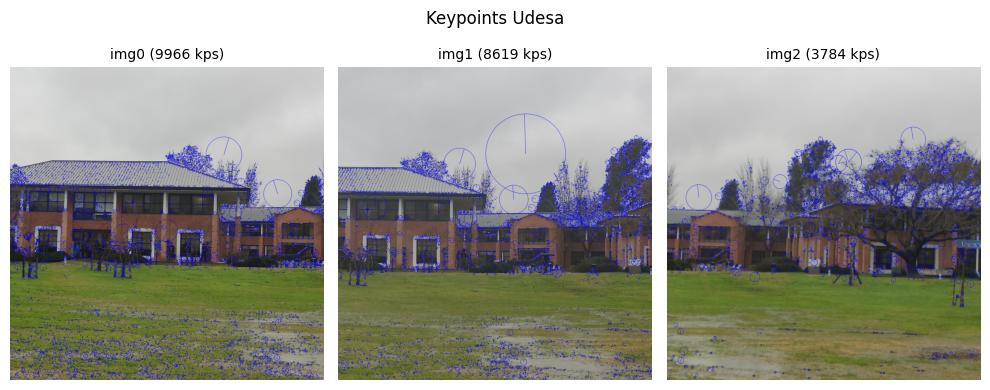

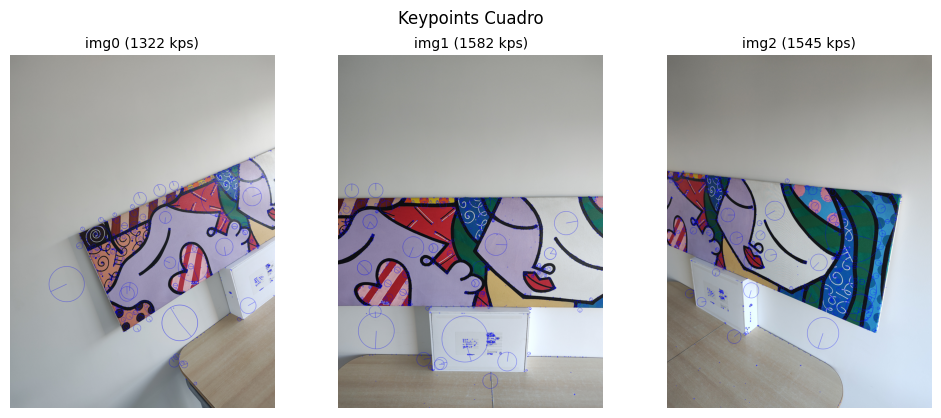

In [8]:
img0_kp_udesa = cv2.drawKeypoints(img0_udesa, kp0_udesa, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img1_kp_udesa = cv2.drawKeypoints(img1_udesa, kp1_udesa, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_kp_udesa = cv2.drawKeypoints(img2_udesa, kp2_udesa, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

img0_kp_cuadro = cv2.drawKeypoints(img0_cuadro, kp0_cuadro, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img1_kp_cuadro = cv2.drawKeypoints(img1_cuadro, kp1_cuadro, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_kp_cuadro = cv2.drawKeypoints(img2_cuadro, kp2_cuadro, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

show_images([img0_kp_udesa, img1_kp_udesa, img2_kp_udesa], 
            [f'img0 ({len(kp0_udesa)} kps)', f'img1 ({len(kp1_udesa)} kps)', f'img2 ({len(kp2_udesa)} kps)'],
            title='Keypoints Udesa')

show_images([img0_kp_cuadro, img1_kp_cuadro, img2_kp_cuadro], 
            [f'img0 ({len(kp0_cuadro)} kps)', f'img1 ({len(kp1_cuadro)} kps)', f'img2 ({len(kp2_cuadro)} kps)'],
            title='Keypoints Cuadro')

## Aplicamos ANMS para obtener los N keypoints mejor distribuidos

In [9]:
kp0_udesa, desc0_udesa = anms(kp0_udesa, desc0_udesa, N=600)
kp1_udesa, desc1_udesa = anms(kp1_udesa, desc1_udesa, N=600)
kp2_udesa, desc2_udesa = anms(kp2_udesa, desc2_udesa, N=600)

kp0_cuadro, desc0_cuadro = anms(kp0_cuadro, desc0_cuadro, N=600)
kp1_cuadro, desc1_cuadro = anms(kp1_cuadro, desc1_cuadro, N=600)
kp2_cuadro, desc2_cuadro = anms(kp2_cuadro, desc2_cuadro, N=600)

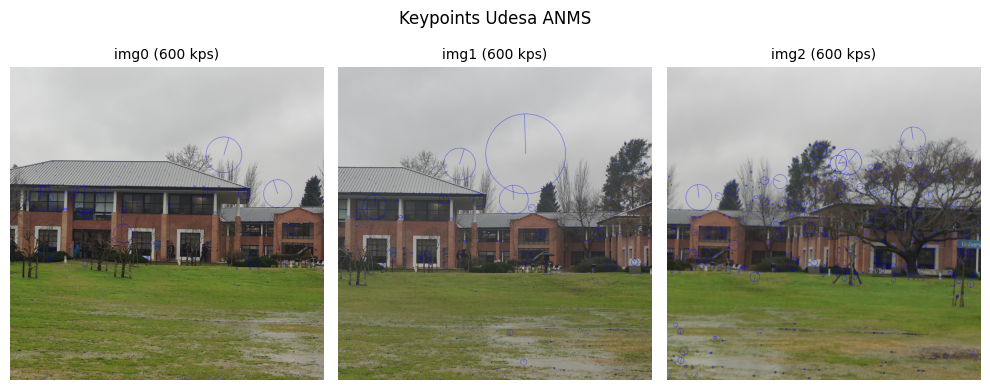

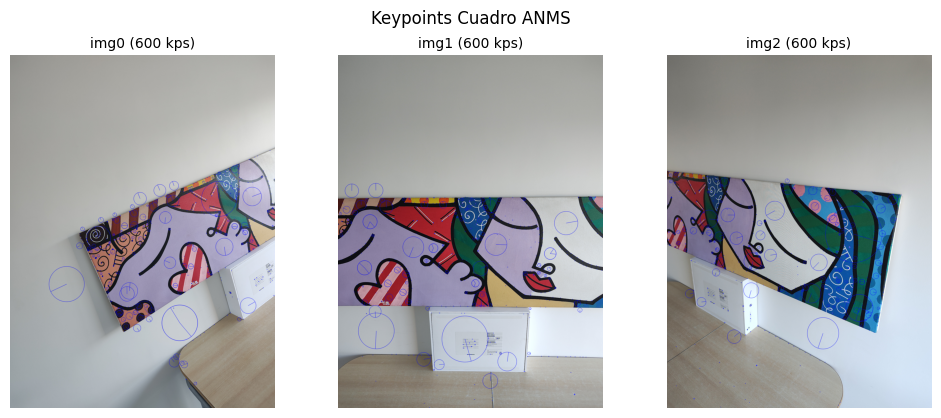

In [10]:
img0_kp_udesa = cv2.drawKeypoints(img0_udesa, kp0_udesa, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img1_kp_udesa = cv2.drawKeypoints(img1_udesa, kp1_udesa, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_kp_udesa = cv2.drawKeypoints(img2_udesa, kp2_udesa, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

img0_kp_cuadro = cv2.drawKeypoints(img0_cuadro, kp0_cuadro, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img1_kp_cuadro = cv2.drawKeypoints(img1_cuadro, kp1_cuadro, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_kp_cuadro = cv2.drawKeypoints(img2_cuadro, kp2_cuadro, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

show_images([img0_kp_udesa, img1_kp_udesa, img2_kp_udesa], 
            [f'img0 ({len(kp0_udesa)} kps)', f'img1 ({len(kp1_udesa)} kps)', f'img2 ({len(kp2_udesa)} kps)'],
            title='Keypoints Udesa ANMS')
show_images([img0_kp_cuadro, img1_kp_cuadro, img2_kp_cuadro], 
            [f'img0 ({len(kp0_cuadro)} kps)', f'img1 ({len(kp1_cuadro)} kps)', f'img2 ({len(kp2_cuadro)} kps)'],
            title='Keypoints Cuadro ANMS')


## Asociamos las características de las imagenes 0 y 2 con el ancla.
## Usamos Brute Force con distintos filtros: Lowe Ratio Test, Cross Check, y ambos juntos

### Lowe Ratio test

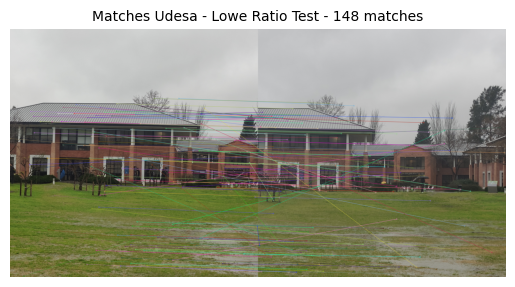

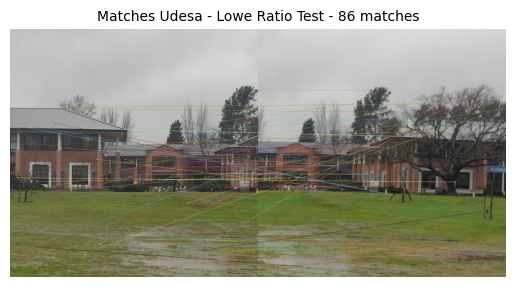

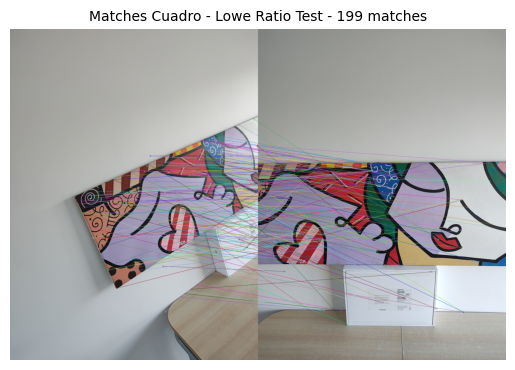

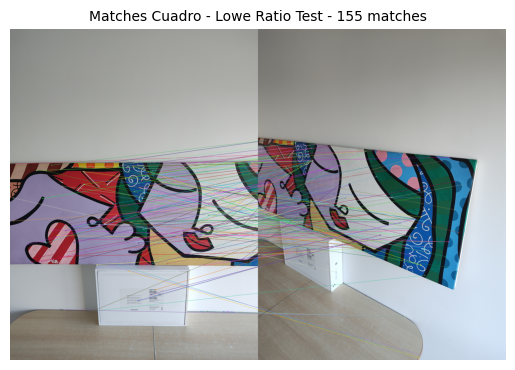

In [11]:
matches_01_udesa = match_descriptors(desc0_udesa, desc1_udesa, method='lowe', ratio_thresh=0.85)
draw_matches(img0_udesa, kp0_udesa, img1_udesa, kp1_udesa, matches_01_udesa, title='Matches Udesa - Lowe Ratio Test')

matches_12_udesa = match_descriptors(desc1_udesa, desc2_udesa, method='lowe', ratio_thresh=0.85)
draw_matches(img1_udesa, kp1_udesa, img2_udesa, kp2_udesa, matches_12_udesa, title='Matches Udesa - Lowe Ratio Test')

matches_01_cuadro = match_descriptors(desc0_cuadro, desc1_cuadro, method='lowe', ratio_thresh=0.85)
draw_matches(img0_cuadro, kp0_cuadro, img1_cuadro, kp1_cuadro, matches_01_cuadro, title='Matches Cuadro - Lowe Ratio Test')

matches_12_cuadro = match_descriptors(desc1_cuadro, desc2_cuadro, method='lowe', ratio_thresh=0.85)
draw_matches(img1_cuadro, kp1_cuadro, img2_cuadro, kp2_cuadro, matches_12_cuadro, title='Matches Cuadro - Lowe Ratio Test')

### Cross check

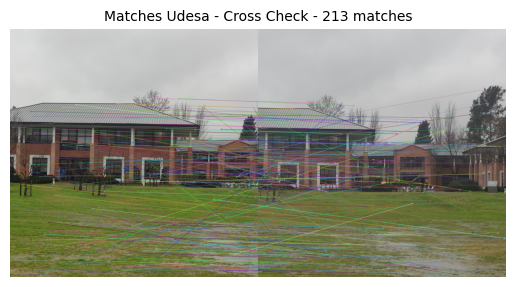

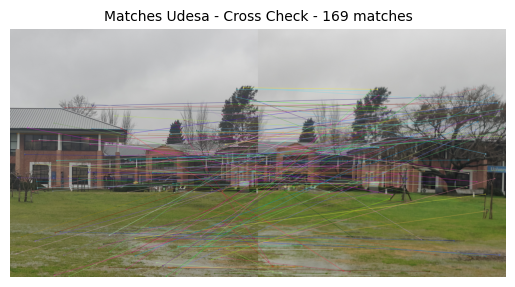

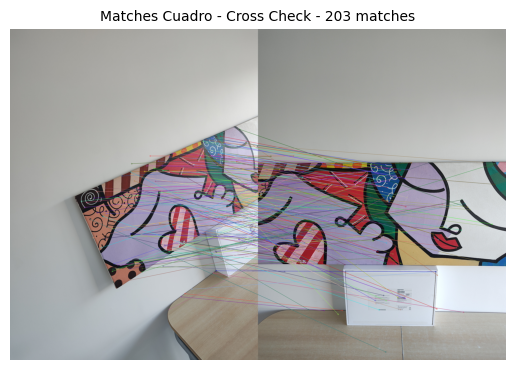

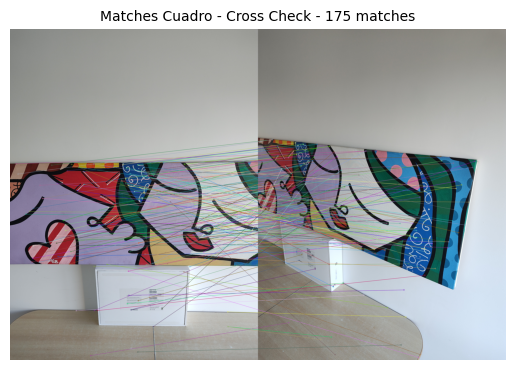

In [12]:
matches_01_cross_udesa = match_descriptors(desc0_udesa, desc1_udesa, method='cross_check')
draw_matches(img0_udesa, kp0_udesa, img1_udesa, kp1_udesa, matches_01_cross_udesa, title='Matches Udesa - Cross Check')

matches_12_cross_udesa = match_descriptors(desc1_udesa, desc2_udesa, method='cross_check')
draw_matches(img1_udesa, kp1_udesa, img2_udesa, kp2_udesa, matches_12_cross_udesa, title='Matches Udesa - Cross Check')

matches_01_cross_cuadro = match_descriptors(desc0_cuadro, desc1_cuadro, method='cross_check')
draw_matches(img0_cuadro, kp0_cuadro, img1_cuadro, kp1_cuadro, matches_01_cross_cuadro, title='Matches Cuadro - Cross Check')

matches_12_cross_cuadro = match_descriptors(desc1_cuadro, desc2_cuadro, method='cross_check')
draw_matches(img1_cuadro, kp1_cuadro, img2_cuadro, kp2_cuadro, matches_12_cross_cuadro, title='Matches Cuadro - Cross Check')

### Ambos métodos juntos

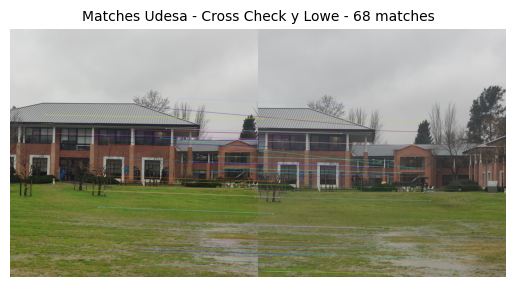

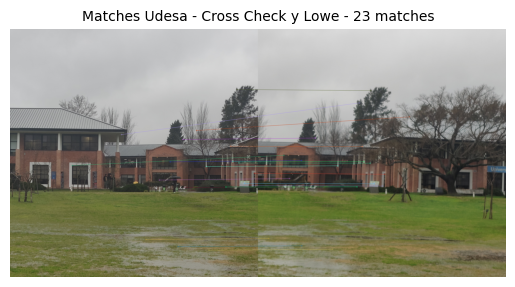

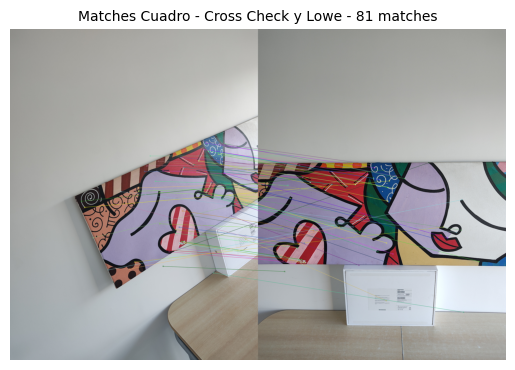

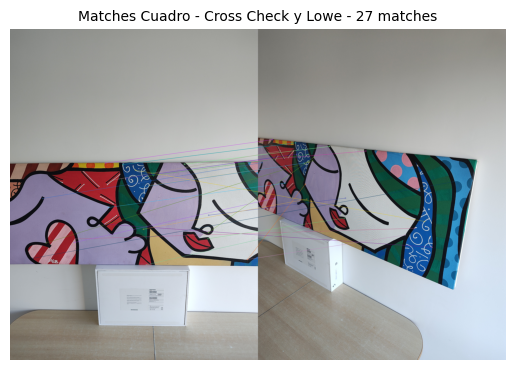

In [13]:
matches_01_cross_y_lowe_udesa = match_descriptors(desc0_udesa, desc1_udesa, method='cross_check_and_lowe')
draw_matches(img0_udesa, kp0_udesa, img1_udesa, kp1_udesa, matches_01_cross_y_lowe_udesa, title='Matches Udesa - Cross Check y Lowe')

matches_12_cross_y_lowe_udesa = match_descriptors(desc1_udesa, desc2_udesa, method='cross_check_and_lowe')
draw_matches(img1_udesa, kp1_udesa, img2_udesa, kp2_udesa, matches_12_cross_y_lowe_udesa, title='Matches Udesa - Cross Check y Lowe')

matches_01_cross_y_lowe_cuadro = match_descriptors(desc0_cuadro, desc1_cuadro, method='cross_check_and_lowe')
draw_matches(img0_cuadro, kp0_cuadro, img1_cuadro, kp1_cuadro, matches_01_cross_y_lowe_cuadro, title='Matches Cuadro - Cross Check y Lowe')

matches_12_cross_y_lowe_cuadro = match_descriptors(desc1_cuadro, desc2_cuadro, method='cross_check_and_lowe')
draw_matches(img1_cuadro, kp1_cuadro, img2_cuadro, kp2_cuadro, matches_12_cross_y_lowe_cuadro, title='Matches Cuadro - Cross Check y Lowe')

## Aplicamos DLT para estimar manualmente una Homografía con 4 pares de puntos seleccionados manualmente

In [14]:
matches_manual_udesa_01 = {
    "image0": [[1508,915],[1131,1549],[2852,1351],[2516,1764],],
    "image1": [[619,972],[239,1616],[1965,1406],[1641,1818],]
}

matches_manual_udesa_21 = {
    "image1": [[1909,1420],[1581,1768],[2923,1911],[2754,1400],],
    "image2": [[508,1400],[152,1741],[1494,1916],[1351,1407],]
}

matches_manual_cuadro_01 = {
    "image0": [[1609, 1942],[2776, 1218],[1981, 2783],[2893, 2210],],
    "image1": [[147, 1896],[2109, 1654],[315, 2908],[1796, 2919],]
}

matches_manual_cuadro_21 = {
    "image1": [[460, 1799],[315, 2908],[2967, 1691],[2782, 2881],],
    "image2": [[61, 1451],[26, 2207],[1460, 1548],[1319, 2709],]
}


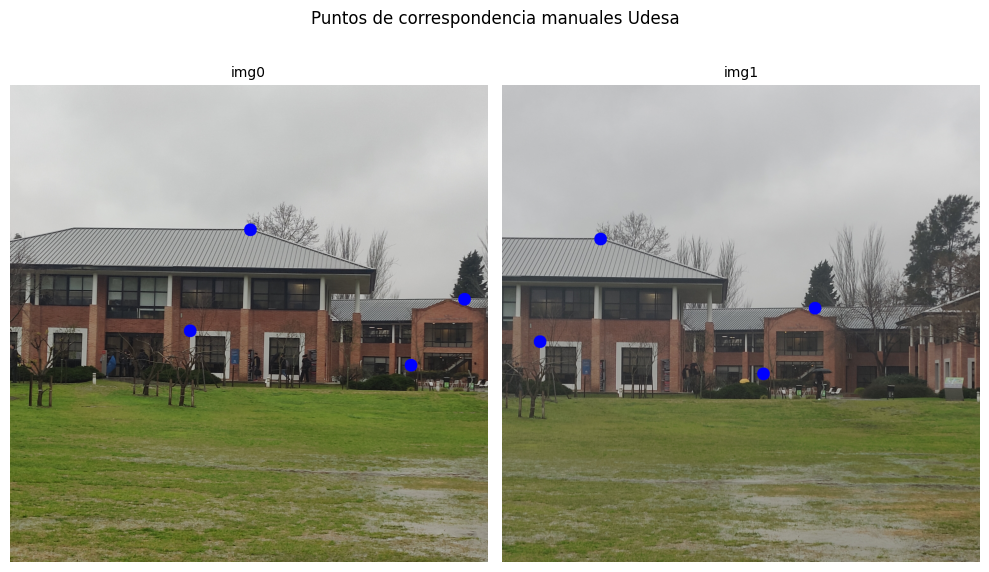

Homografía manual entre img0 y img1:
[[ 1.05890334e+00  1.17002498e-02 -4.86125859e+02]
 [ 2.04374615e-02  1.03550589e+00  9.62843516e+00]
 [ 3.61929779e-05 -2.16094762e-06  1.00000000e+00]]


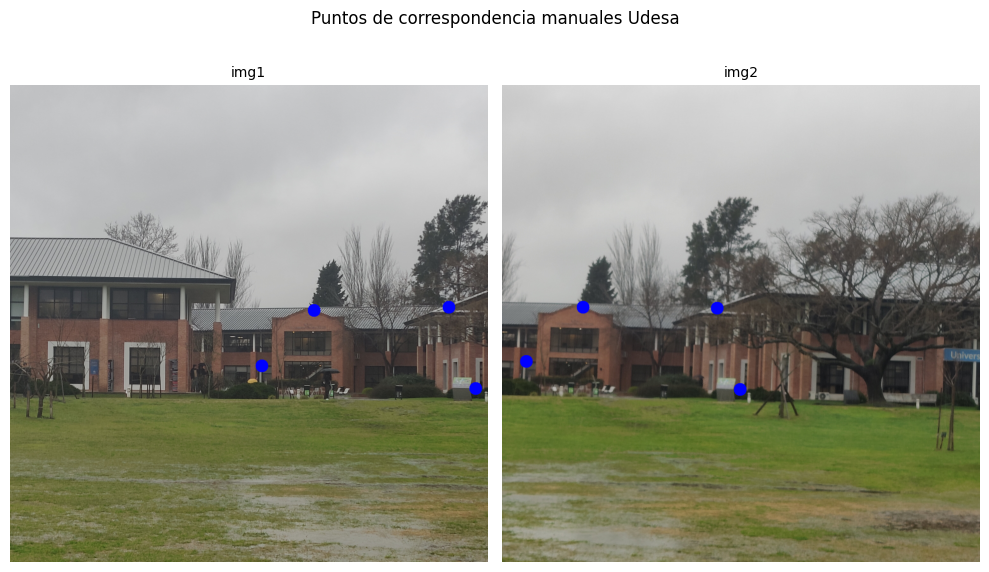

Homografía manual entre img1 y img2:
[[ 1.04436619e+00 -6.43807401e-02 -6.91963520e+02]
 [ 6.12498394e-02  1.00144621e+00 -5.52315928e+01]
 [ 4.07391040e-05 -2.60797691e-05  1.00000000e+00]]


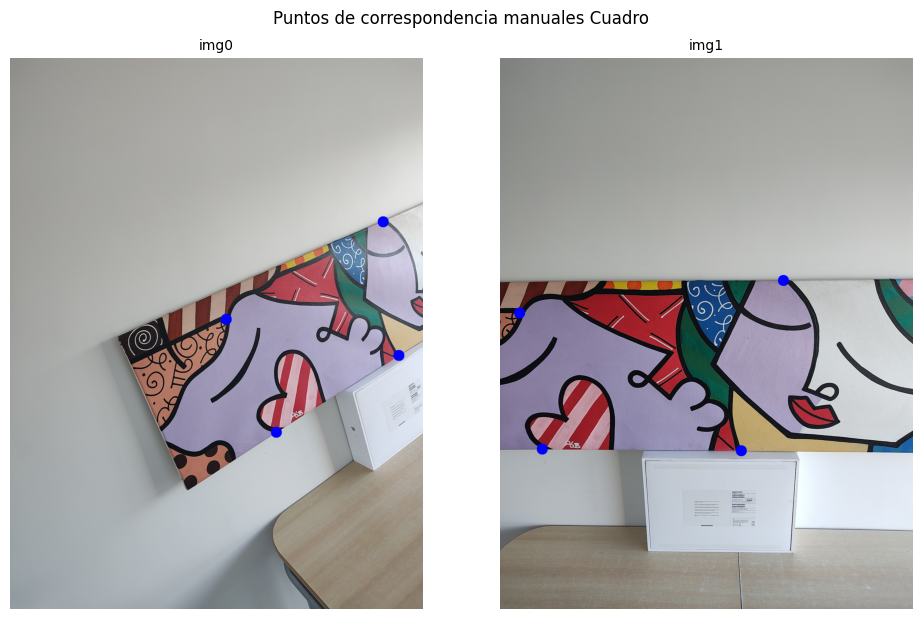

Homografía manual entre img0 y img1:
[[ 1.02016244e+00 -2.68389051e-01 -4.81618394e+02]
 [ 1.77516886e-01  1.02598616e+00 -2.69224070e+02]
 [-2.59515274e-04  1.20858863e-04  1.00000000e+00]]


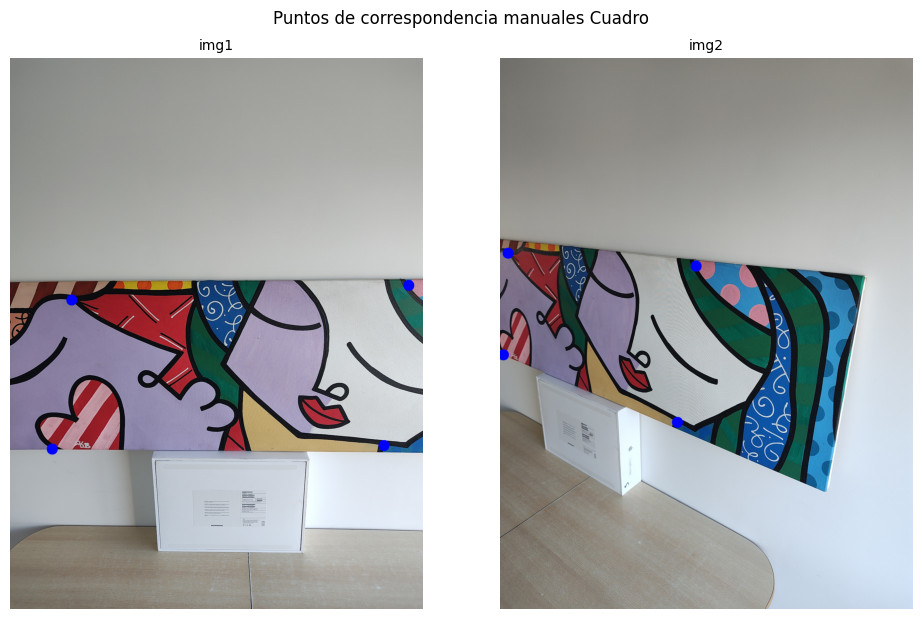

Homografía manual entre img1 y img2:
[[ 3.57872598e-01  1.71099433e-02 -6.67498088e+01]
 [-1.23376753e-01  6.98239102e-01  9.61315557e+01]
 [-2.51361645e-04  2.13223113e-05  1.00000000e+00]]


In [15]:

# For Udesa 0-1
H_udesa_01_manual = show_manual_matches_and_compute_H(
    matches_manual_udesa_01,
    resize_factor_udesa,
    {0: img0_udesa, 1: img1_udesa},
    title_prefix="manuales Udesa"
)

# For Udesa 1-2
H_udesa_21_manual = show_manual_matches_and_compute_H(
    matches_manual_udesa_21,
    resize_factor_udesa,
    {1: img1_udesa, 2: img2_udesa},
    title_prefix="manuales Udesa"
)

# For Cuadro 0-1
H_cuadro_01_manual = show_manual_matches_and_compute_H(
    matches_manual_cuadro_01,
    resize_factor_cuadro,
    {0: img0_cuadro, 1: img1_cuadro},
    title_prefix="manuales Cuadro"
)

# For Cuadro 1-2
H_cuadro_21_manual = show_manual_matches_and_compute_H(
    matches_manual_cuadro_21,
    resize_factor_cuadro,
    {1: img1_cuadro, 2: img2_cuadro},
    title_prefix="manuales Cuadro"
)

## Aplicamos RANSAC para elimimar outliers, y comparamos con el RANSAC de opencv

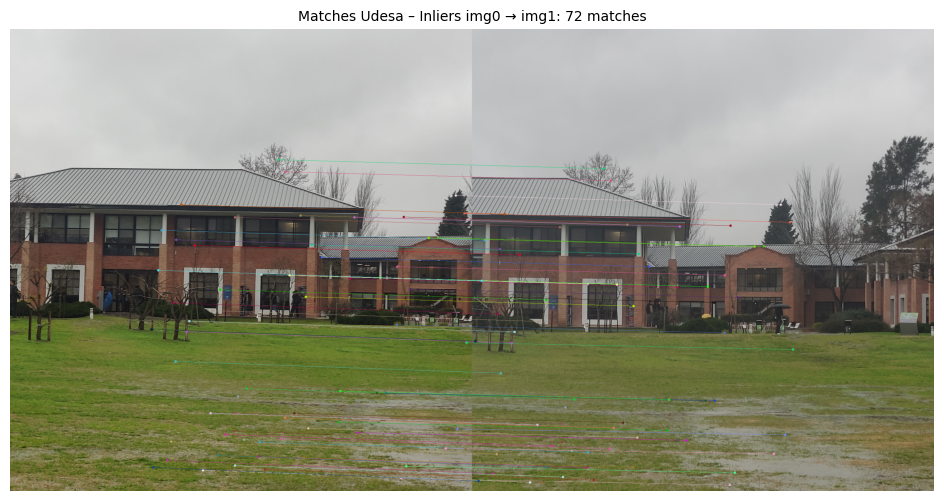

Matriz de homografía H – UDESA 0<->1:
[[ 1.05212032e+00  1.23134359e-02 -4.83376882e+02]
 [ 1.40479056e-02  1.03019109e+00  1.59809781e+01]
 [ 2.93583403e-05  6.52477617e-07  1.00000000e+00]]


In [16]:
# Obtener puntos de los keypoints según los matches
pts0 = np.float32([kp0_udesa[m.queryIdx].pt for m in matches_01_udesa])
pts1 = np.float32([kp1_udesa[m.trainIdx].pt for m in matches_01_udesa])

# Estimar homografía usando nuestra implementación de RANSAC
H_udesa, inlier_mask_udesa = ransac_homography(pts0, pts1, num_iters=2000, threshold=5.0)

# Filtrar los matches inliers
inlier_matches_01_udesa = [m for m, keep in zip(matches_01_udesa, inlier_mask_udesa) if keep]

# Visualizar matches inliers
img_matches_01_udesa = draw_matches_ransac(img0_udesa, kp0_udesa, img1_udesa, kp1_udesa, inlier_matches_01_udesa)

imshow(img_matches_01_udesa, title=f'Matches Udesa – Inliers img0 → img1: {len(inlier_matches_01_udesa)} matches', figsize=(12, 6))
print("Matriz de homografía H – UDESA 0<->1:")
print(H_udesa)


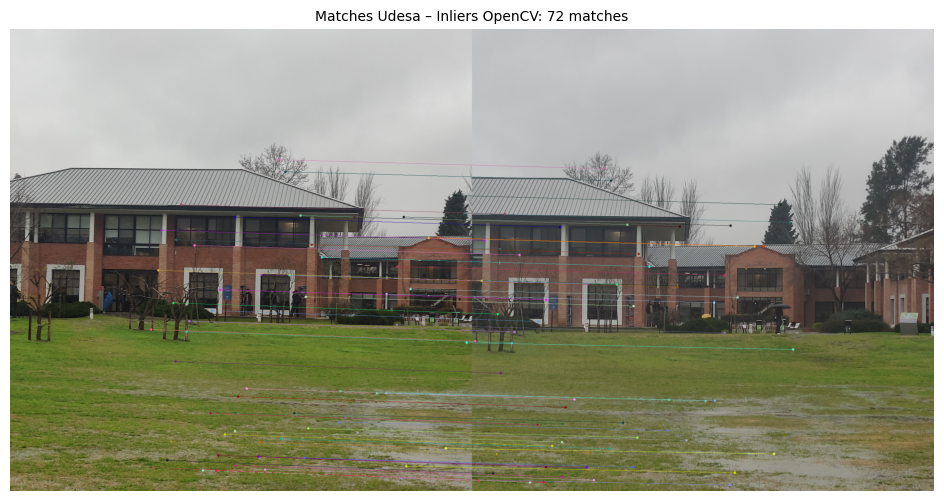

Matriz de homografía H (Ransac de OpenCV) - UDESA:
[[ 1.05865013e+00  1.11165665e-02 -4.86015765e+02]
 [ 1.85721463e-02  1.03344916e+00  1.22656249e+01]
 [ 3.31585415e-05  6.41461692e-07  1.00000000e+00]]


In [17]:
# === RANSAC con OpenCV (para comparar) ===

# Obtener puntos (mismo proceso que para tu RANSAC)
pts0_cv = np.float32([kp0_udesa[m.queryIdx].pt for m in matches_01_udesa])
pts1_cv = np.float32([kp1_udesa[m.trainIdx].pt for m in matches_01_udesa])

# Usar OpenCV para estimar homografía con RANSAC
H_cv_udesa, mask_cv_udesa = cv2.findHomography(pts0_cv, pts1_cv, cv2.RANSAC, ransacReprojThreshold=5.0)

# Filtrar matches válidos (inliers)
inlier_matches_cv_udesa = [m for m, keep in zip(matches_01_udesa, mask_cv_udesa.ravel()) if keep]

# Dibujar matches con los inliers de OpenCV
img_matches_cv_udesa = draw_matches_ransac(img0_udesa, kp0_udesa, img1_udesa, kp1_udesa, inlier_matches_cv_udesa)
imshow(img_matches_cv_udesa, title=f'Matches Udesa – Inliers OpenCV: {len(inlier_matches_cv_udesa)} matches', figsize=(12, 6))
print("Matriz de homografía H (Ransac de OpenCV) - UDESA:")
print(H_cv_udesa)


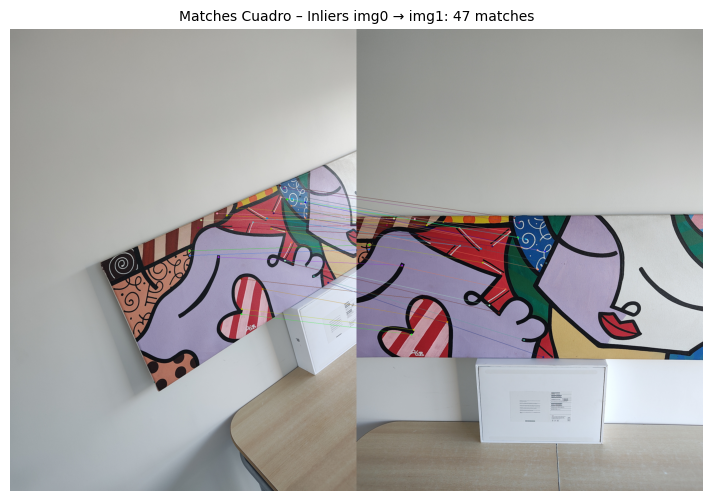

Matriz de homografía H – CUADRO:
[[ 1.05608167e+00 -2.69759250e-01 -5.03595513e+02]
 [ 2.10956064e-01  1.06880127e+00 -3.13504435e+02]
 [-2.42620024e-04  1.31608127e-04  1.00000000e+00]]


In [18]:
# === RANSAC para CUADRO ===
# Obtener puntos de los keypoints según los matches
pts0 = np.float32([kp0_cuadro[m.queryIdx].pt for m in matches_01_cuadro])
pts1 = np.float32([kp1_cuadro[m.trainIdx].pt for m in matches_01_cuadro])

# Estimar homografía usando RANSAC (tu implementación)
H_cuadro, inlier_mask_cuadro = ransac_homography(pts0, pts1, num_iters=2000, threshold=5.0)

# Filtrar los matches inliers
inlier_matches_01_cuadro = [m for m, keep in zip(matches_01_cuadro, inlier_mask_cuadro) if keep]

# Visualizar matches inliers
img_matches_01_cuadro = draw_matches_ransac(img0_cuadro, kp0_cuadro, img1_cuadro, kp1_cuadro, inlier_matches_01_cuadro)

imshow(img_matches_01_cuadro, title=f'Matches Cuadro – Inliers img0 → img1: {len(inlier_matches_01_cuadro)} matches', figsize=(12, 6))

print("Matriz de homografía H – CUADRO:")
print(H_cuadro)


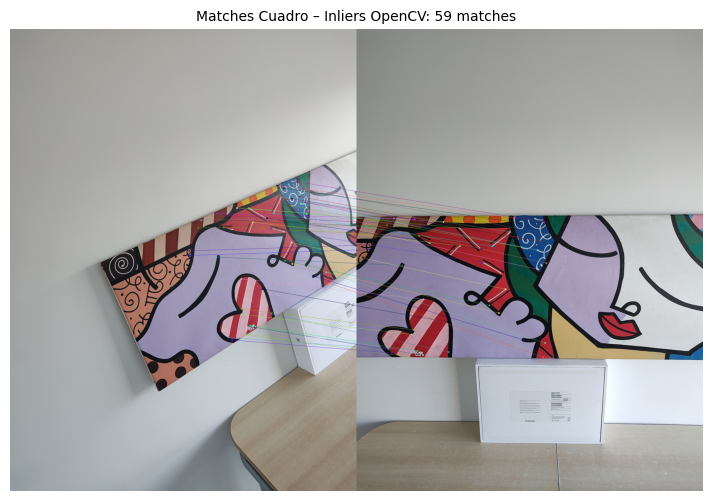

Matriz de homografía H (OpenCV) - CUADRO:
[[ 1.07311368e+00 -2.81830922e-01 -5.09687675e+02]
 [ 2.18365061e-01  1.06717001e+00 -3.16056861e+02]
 [-2.36665230e-04  1.29214551e-04  1.00000000e+00]]


In [19]:
# === RANSAC con OpenCV para comparar ===

# Obtener puntos desde los keypoints y matches
pts0_cv_cuadro = np.float32([kp0_cuadro[m.queryIdx].pt for m in matches_01_cuadro])
pts1_cv_cuadro = np.float32([kp1_cuadro[m.trainIdx].pt for m in matches_01_cuadro])

# Estimar homografía usando RANSAC de OpenCV
H_cv_cuadro, mask_cv_cuadro = cv2.findHomography(pts0_cv_cuadro, pts1_cv_cuadro, cv2.RANSAC, ransacReprojThreshold=5.0)

# Filtrar matches válidos
inlier_matches_cv_cuadro = [m for m, keep in zip(matches_01_cuadro, mask_cv_cuadro.ravel()) if keep]

# Dibujar los matches con los inliers
img_matches_cv_cuadro = draw_matches_ransac(img0_cuadro, kp0_cuadro, img1_cuadro, kp1_cuadro, inlier_matches_cv_cuadro)

imshow(img_matches_cv_cuadro, title=f'Matches Cuadro – Inliers OpenCV: {len(inlier_matches_cv_cuadro)} matches', figsize=(12, 6))

print("Matriz de homografía H (OpenCV) - CUADRO:")
print(H_cv_cuadro)

# Juntamos todo para obtener las panoramicas

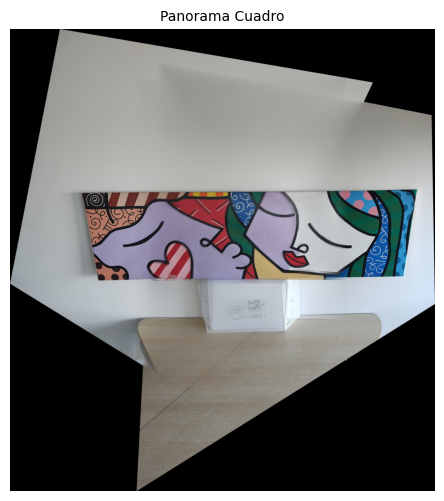

True

In [20]:
kp0, desc0 = anms(*detect_features(gray0_cuadro), N=1000)
kp1, desc1 = anms(*detect_features(gray1_cuadro), N=1000)
kp2, desc2 = anms(*detect_features(gray2_cuadro), N=1000)

matches01 = match_descriptors(desc0, desc1, method="cross_check_and_lowe")
matches21 = match_descriptors(desc2, desc1, method="cross_check_and_lowe")

pts0 = np.float32([kp0[m.queryIdx].pt for m in matches01])
pts1_0 = np.float32([kp1[m.trainIdx].pt for m in matches01])
pts2 = np.float32([kp2[m.queryIdx].pt for m in matches21])
pts1_2 = np.float32([kp1[m.trainIdx].pt for m in matches21])

H01, _ = ransac_homography(pts0, pts1_0, num_iters=2000, threshold=5.0)
H12, _ = ransac_homography(pts2, pts1_2, num_iters=2000, threshold=5.0)

panorama_cuadro = stitch_images_with_blending(img0_cuadro, img1_cuadro, img2_cuadro, H01, H12)

imshow(panorama_cuadro, title='Panorama Cuadro', figsize=(12, 6))

cv2.imwrite("panorama_cuadro_final.jpg", panorama_cuadro)

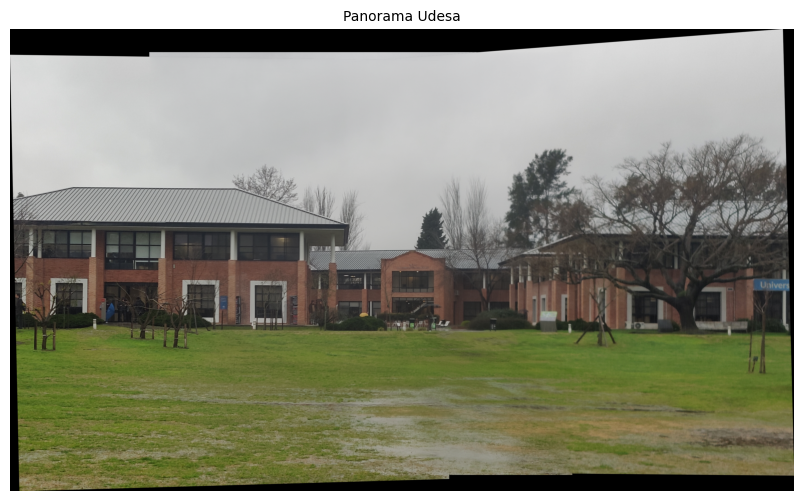

True

In [21]:
kp0, desc0 = anms(*detect_features(gray0_udesa), N=1000)
kp1, desc1 = anms(*detect_features(gray1_udesa), N=1000)
kp2, desc2 = anms(*detect_features(gray2_udesa), N=1000)

matches01 = match_descriptors(desc0, desc1, method="cross_check_and_lowe")
matches21 = match_descriptors(desc2, desc1, method="cross_check_and_lowe")

pts0 = np.float32([kp0[m.queryIdx].pt for m in matches01])
pts1_0 = np.float32([kp1[m.trainIdx].pt for m in matches01])
pts2 = np.float32([kp2[m.queryIdx].pt for m in matches21])
pts1_2 = np.float32([kp1[m.trainIdx].pt for m in matches21])

H01, _ = ransac_homography(pts0, pts1_0)
H12, _ = ransac_homography(pts2, pts1_2)

panorama_udesa = stitch_images_with_blending(img0_udesa, img1_udesa, img2_udesa, H01, H12)

imshow(panorama_udesa, title='Panorama Udesa', figsize=(12, 6))

cv2.imwrite("panorama_udesa_final.jpg", panorama_udesa)

## Con fotos nuestras

In [ ]:

# import 3 fotos de udesa otras de img_nuestras
images_color_udesa_nuestro, images_gray_udesa_nuestro, resize_factors_udesa_nuestro = load_images_from_folder("img_nuestras", target_width=1500)

img0_udesa_nuestro, img1_udesa_nuestro, img2_udesa_nuestro = images_color_udesa_nuestro
gray0_udesa_nuestro, gray1_udesa_nuestro, gray2_udesa_nuestro = images_gray_udesa_nuestro
resize_factor_udesa_nuestro = resize_factors_udesa_nuestro
show_images([img0_udesa_nuestro, img1_udesa_nuestro, img2_udesa_nuestro], ['img0', 'img1', 'img2'], title='Imágenes Udesa Nuestras')

kp0, desc0 = anms(*detect_features(gray0_udesa_nuestro), N=1000)
kp1, desc1 = anms(*detect_features(gray1_udesa_nuestro), N=1000)
kp2, desc2 = anms(*detect_features(gray2_udesa_nuestro), N=1000)

matches01 = match_descriptors(desc0, desc1, method="cross_check_and_lowe")
matches21 = match_descriptors(desc2, desc1, method="cross_check_and_lowe")

pts0 = np.float32([kp0[m.queryIdx].pt for m in matches01])
pts1_0 = np.float32([kp1[m.trainIdx].pt for m in matches01])
pts2 = np.float32([kp2[m.queryIdx].pt for m in matches21])
pts1_2 = np.float32([kp1[m.trainIdx].pt for m in matches21])

H01, _ = ransac_homography(pts0, pts1_0)
H12, _ = ransac_homography(pts2, pts1_2)

panorama_udesa = stitch_images_with_blending(img0_udesa_nuestro, img1_udesa_nuestro, img2_udesa_nuestro, H01, H12)

imshow(panorama_udesa, title='Panorama Udesa', figsize=(12, 6))

cv2.imwrite("panorama_udesa_final.jpg", panorama_udesa)

NameError: name 'gray0_udesa_nuestro' is not defined